In [1]:
## 경고 제거##
import warnings
warnings.filterwarnings('always')
warnings.filterwarnings('ignore')

## DataFrame & visual option ##
import pandas as pd
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))
pd.set_option('display.max_columns', None)
import polars as pl

import numpy as np
import os
import json

#progress bar
from tqdm import tqdm
## geo ##
import geopandas as gpd

## Visualize option ##
import seaborn as sns
import matplotlib.pyplot as plt
import ipywidgets as widgets

#stats
import scipy.stats as st

#ML
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import (mean_squared_error, median_absolute_error,mean_absolute_error, r2_score)
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split,GridSearchCV, KFold
from sklearn.preprocessing import OneHotEncoder, StandardScaler, MinMaxScaler, RobustScaler, MaxAbsScaler
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer

plt.rcParams['axes.unicode_minus'] = False
plt.rcParams['font.family'] = 'D2Coding'

# Data Read & Preprocessing
- 장비의 도로유형, 도로선형등을 파생변수로 활용하려 했으나 null값이 존재하여 불가
- 파생변수 생성용 확인
    - 단속형태를 가지고 파생변수 

## remodel 변환완료용 read

In [21]:
mts = pd.read_csv('./use_data/csv/230920_교통과학장비 설치정보_경기남부.csv')
mts['특정도로'].fillna('일반구역',inplace=True)
preraw = pd.read_csv('./use_data/result/input/fullraw_4_remodel.csv')
#raw = preraw.copy()
#raw.drop(columns = ['기준일자','장비고유구분','설치지역','기상관측지역','기준연월','장비설치일자'],inplace=True)

In [25]:
mts[mts['구간그룹명'].isin(['오성면구간','신대리구간'])]

,장비번호,*장비종류,*단속형태,*납품업체,*제조업체,제조번호,최초운영일자,*장비규격,구간그룹명,*지방청,*자산구분,*관리·설치일,설치구분/지자체명,관리종료일,종료구분,관리이관,설치(이전)회차,설치일자,*설치장소,센터와의거리,*관할서,제어기 위도,제어기 경도,표지판 위도,표지판 경도,*표지판 개수,*차량검지,설치·단속 차로수,도로차로수(편도),*제한속도(소형),*제한속도(대형),*단속속도(소형),*단속속도(대형),*도로종류,노선번호,노선명,특정도로,*도로유형,도로선형,조명장치
1552,G9150,속도위반,구간과속,알티솔루션,알티솔루션,NaN,2021-07-31,('17.03) -아,신대리구간,경기남부,지자체,2021-07-31,평택시,NaN,NaN,NaN,1,2021-07-31,"평택시 팽성읍 신대리 90-94 신대교차로 지나 300m지점 시점 1,2차로(아산→수원)",43.2,평택경찰서,36.946676,126.991727,36.936199,126.994563,2.0,레이다센서,2.0,3.0,90,90,105.0,105.0,국도,43,세종평택로,일반구역,단일로,직선평지,LED
1553,G9151,속도위반,구간과속,알티솔루션,알티솔루션,NaN,2021-07-31,('17.03) -아,신대리구간,경기남부,지자체,2021-07-31,평택시,NaN,NaN,NaN,1,2021-07-31,평택시 팽성읍 신대리 90-94 신대교차로 지나 300m지점 시점 3차로(아산→수원),43.2,평택경찰서,36.946702,126.991724,36.936199,126.994563,2.0,레이다센서,1.0,3.0,90,90,105.0,105.0,국도,43,세종평택로,일반구역,단일로,직선평지,LED
1554,G9152,속도위반,구간과속,알티솔루션,알티솔루션,NaN,2021-07-31,('17.03) -아,신대리구간,경기남부,지자체,2021-07-31,평택시,NaN,NaN,NaN,1,2021-07-31,"평택시 오성면 숙성리 312-2 오성2교 앞 종점 1,2차로(아산→수원)",34.3,평택경찰서,37.008381,126.989042,36.992812,126.976635,2.0,레이다센서,2.0,3.0,90,90,105.0,105.0,국도,43,세종평택로,일반구역,단일로,직선평지,LED
1555,G9153,속도위반,구간과속,알티솔루션,알티솔루션,NaN,2021-07-31,('17.03) -아,신대리구간,경기남부,지자체,2021-07-31,평택시,NaN,NaN,NaN,1,2021-07-31,평택시 오성면 숙성리 312-2 오성2교 앞 종점 3차로(아산→수원),34.3,평택경찰서,37.008399,126.989039,36.992812,126.976635,2.0,레이다센서,1.0,3.0,90,90,105.0,105.0,국도,43,세종평택로,일반구역,단일로,직선평지,LED
1581,G9577,속도위반,구간과속,아프로시스템즈,아프로시스템즈,NaN,2021-08-31,('17.03) -아,오성면구간,경기남부,지자체,2021-08-31,평택시,NaN,NaN,NaN,1,2021-08-31,"평택시 오성면 숙성리 312-2 오성2교 앞 시점 1,2차로(수원→아산)",42.1,평택경찰서,37.008358,126.988682,37.025736,126.984536,2.0,레이다센서,2.0,3.0,90,90,105.0,105.0,국도,43,세종평택로,일반구역,단일로,직선평지,LED
1582,G9578,속도위반,구간과속,아프로시스템즈,아프로시스템즈,NaN,2021-08-31,('17.03) -아,오성면구간,경기남부,지자체,2021-08-31,평택시,NaN,NaN,NaN,1,2021-08-31,평택시 오성면 숙성리 312-2 오성2교 앞 시점 3차로(수원→아산),42.1,평택경찰서,37.008358,126.988682,37.025736,126.984536,2.0,레이다센서,1.0,3.0,90,90,105.0,105.0,국도,43,세종평택로,일반구역,단일로,직선평지,LED
1583,G9579,속도위반,구간과속,아프로시스템즈,아프로시스템즈,NaN,2021-08-31,('17.03) -아,오성면구간,경기남부,지자체,2021-08-31,평택시,NaN,NaN,NaN,1,2021-08-31,"평택시 팽성읍 신대리 90-94 신대교차로 지나 300m지점 종점 1,2차로(수원→아산)",44.3,평택경찰서,36.946640,126.991360,36.959883,126.980939,2.0,레이다센서,2.0,3.0,90,90,105.0,105.0,국도,43,세종평택로,일반구역,단일로,직선평지,LED
1584,G9580,속도위반,구간과속,아프로시스템즈,아프로시스템즈,NaN,2021-08-31,('17.03) -아,오성면구간,경기남부,지자체,2021-08-31,평택시,NaN,NaN,NaN,1,2021-08-31,평택시 팽성읍 신대리 90-94 신대교차로 지나 300m지점 종점 3차로(수원→아산),44.3,평택경찰서,36.946602,126.991367,36.959883,126.980939,2.0,레이다센서,1.0,3.0,90,90,105.0,105.0,국도,43,세종평택로,일반구역,단일로,직선평지,LED


In [82]:
raw = pd.DataFrame()
for idx in tqdm(preraw['장비고유구분'].unique()):
    tmp = preraw[preraw['장비고유구분'] == idx]
    try:
        if tmp.iloc[-1,2] == '구간과속':
            if tmp.iloc[-1,1] == '오성면구간,신대리구간':
                vsdf = mts[mts['구간그룹명'] == '오성면구간'].iloc[-1,:]
                tmp['도로종류'] = vsdf['*도로종류']
                tmp['구간유형'] = vsdf['특정도로']
                tmp['도로유형'] = vsdf['*도로유형']
                tmp['도로선형'] = vsdf['도로선형']
                tmp['평균제한속도'] = vsdf['*제한속도(소형)']
    
            else:
                vsdf = mts[mts['구간그룹명'] == idx]
                tmp['도로종류'] = vsdf['*도로종류'].unique()[0]
                tmp['구간유형'] = vsdf['특정도로'].unique()[0]
                tmp['도로유형'] = vsdf['*도로유형'].unique()[0]
                tmp['도로선형'] = vsdf['도로선형'].unique()[0]
                tmp['평균제한속도'] = vsdf['*제한속도(소형)'].unique()[0]
    
        else:
            vsdf = mts[mts['장비번호'] == idx]
            tmp['도로종류'] = vsdf['*도로종류'].unique()[0]
            tmp['구간유형'] = vsdf['특정도로'].unique()[0]
            tmp['도로유형'] = vsdf['*도로유형'].unique()[0]
            tmp['도로선형'] = vsdf['도로선형'].unique()[0]
            tmp['평균제한속도'] = vsdf['*제한속도(소형)'].unique()[0]
    except AttributeError:
        print(idx)

    raw = pd.concat([raw,tmp])
raw = raw[~raw['도로선형'].isna()]
raw.reset_index(drop=True,inplace=True)
            
            

100%|█████████████████████████████████████████████████████████████████████████████████| 427/427 [00:12<00:00, 33.23it/s]


In [90]:
praw = pd.DataFrame()
n = 0
for idx in raw['장비고유구분'].unique():
    tmp = raw[raw['장비고유구분'] == idx]
    tmp.reset_index(drop=True,inplace=True)
    tmp.loc[:364,'평균제한속도'] = 0
    tmp.rename(columns = {'평균제한속도' : '제한속도'},inplace=True)
    praw = pd.concat([praw,tmp])

In [96]:
praw.to_csv('./refine_input_ANM_data_231115.csv',index=False)

In [97]:
praw.info()

<class 'pandas.core.frame.DataFrame'>
Index: 310980 entries, 0 to 729
Data columns (total 33 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   기준일자            310980 non-null  object 
 1   장비고유구분          310980 non-null  object 
 2   단속형태            310980 non-null  object 
 3   설치지역            310980 non-null  object 
 4   기상관측지역          310980 non-null  object 
 5   기준연월            310980 non-null  object 
 6   사고건수            310980 non-null  float64
 7   사망자수            310980 non-null  float64
 8   중상자수            310980 non-null  float64
 9   경상자수            310980 non-null  float64
 10  부상신고자수          310980 non-null  float64
 11  관련차량대수          310980 non-null  float64
 12  평균발생시각          310980 non-null  float64
 13  단속건수            310980 non-null  float64
 14  제한속도            310980 non-null  int64  
 15  평균과속속도          310980 non-null  float64
 16  평균초과속도          310980 non-null  float64
 17  일평균기온           31

### 사용이 간편하게 단속을 앞쪽에 배치

In [5]:
raw = raw[
[ '단속건수', '평균제한속도', '평균과속속도', '평균초과속도', '사고건수', '사망자수', '중상자수', '경상자수', '부상신고자수', '관련차량대수', '평균발생시각',
       '일평균기온', '일최저기온', '일최고기온', '일강수량',
       '일최대순간풍속', '일평균풍속', '일평균상대습도', '일평균중기압', '장비설치지역_주민등록인구수',
       '장비설치지역_차량등록대수', '설치경과일수','단속형태']
]

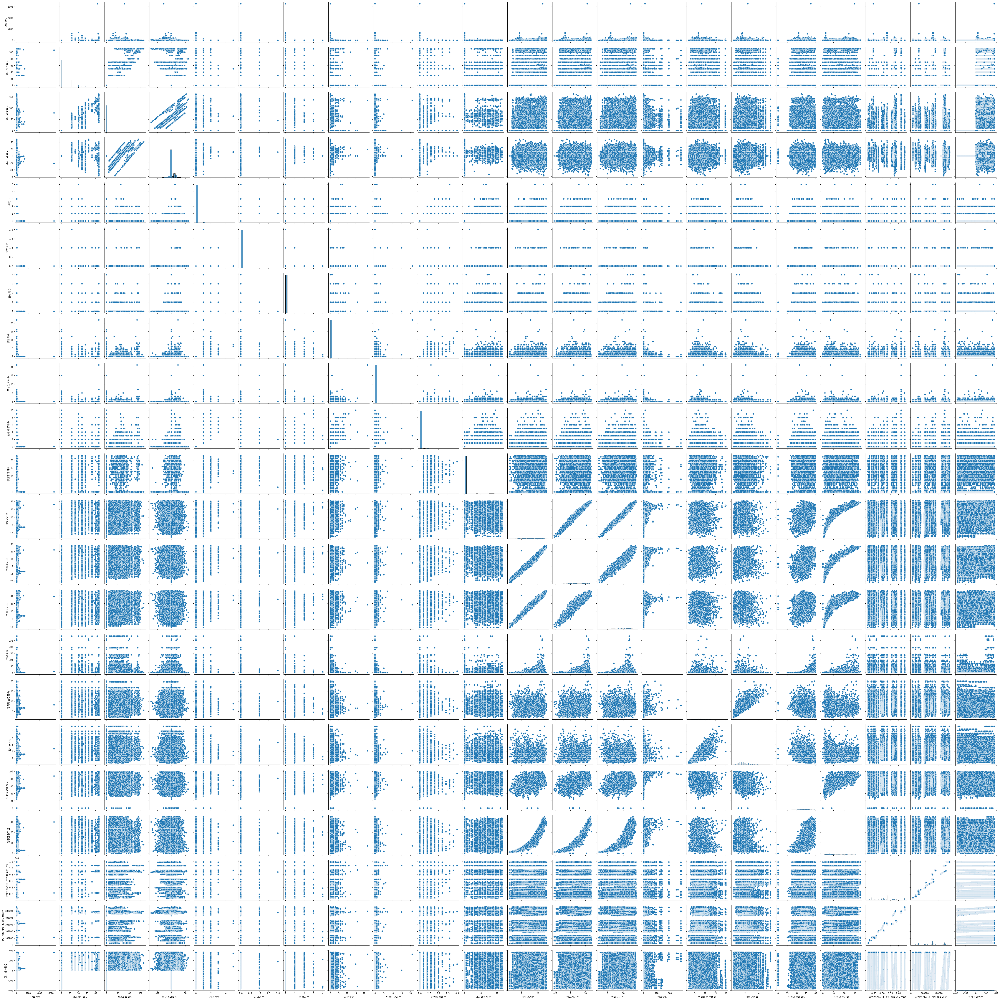

In [158]:
sns.pairplot(raw)

# Data Split & Scaling

1. train, test split
2. scaling
    - train : fit_transform()
    - test : transform()



In [7]:
acc = raw.iloc[:,4:]
vio = raw.iloc[:,:]

#Train / Test Split
acc_Train = acc[acc['설치경과일수'] < 0]
acc_Test = acc[acc['설치경과일수'] >= 0]

vio_Train = vio[vio['설치경과일수'].between(0,182)]
vio_Test = vio[vio['설치경과일수'] >= 183]

# categorize
acc_Train = pd.get_dummies(acc_Train,columns=['단속형태'])
acc_Test = pd.get_dummies(acc_Test,columns=['단속형태'])
vio_Train = pd.get_dummies(vio_Train,columns=['단속형태'])
vio_Test = pd.get_dummies(vio_Test,columns=['단속형태'])

# scaling
acc_scaler = MinMaxScaler()
vio_scaler = MinMaxScaler()

# Train fitting
acc_scaler.fit(acc_Train)
vio_scaler.fit(vio_Train)

scaled_acc_Train = acc_scaler.transform(acc_Train)
scaled_acc_Test = acc_scaler.transform(acc_Test)
scaled_vio_Train = vio_scaler.transform(vio_Train)
scaled_vio_Test = vio_scaler.transform(vio_Test)

# To DF
acc_Train = pd.DataFrame(scaled_acc_Train,columns=acc_Train.columns)
acc_Test = pd.DataFrame(scaled_acc_Test,columns=acc_Test.columns)
vio_Train = pd.DataFrame(scaled_vio_Train,columns=vio_Train.columns)
vio_Test = pd.DataFrame(scaled_vio_Test,columns=vio_Test.columns)


# Train - Validation Split
acc_X_train, acc_X_test, acc_y_train, acc_y_test = train_test_split(acc_Train.iloc[:,1:],acc_Train.iloc[:,0],test_size=0.2, random_state=256,shuffle=True)

vio_X_train, vio_X_test, vio_y_train, vio_y_test = train_test_split(vio_Train.iloc[:,1:],vio_Train.iloc[:,0],test_size=0.2, random_state=256,shuffle=True)

#model
acc_model = RandomForestRegressor()
vio_model = RandomForestRegressor()

#fitting
acc_model.fit(acc_X_train, acc_y_train)
vio_model.fit(vio_X_train, vio_y_train)

#predict
acc_y_pred = acc_model.predict(acc_X_test)
vio_y_pred = vio_model.predict(vio_X_test)

#estimate
acc_mse = mean_squared_error(acc_y_test, acc_y_pred)
acc_mae = mean_absolute_error(acc_y_test, acc_y_pred)
acc_r2 = r2_score(acc_y_test, acc_y_pred)

vio_mse = mean_squared_error(vio_y_test, vio_y_pred)
vio_mae = mean_absolute_error(vio_y_test, vio_y_pred)
vio_r2 = r2_score(vio_y_test, vio_y_pred)


print(f'acc Mean Squared Error: {acc_mse}')
print(f'acc Mean Absolute Error: {acc_mae}')
print(f'acc R-squared: {acc_r2}')

print(f'vio Mean Squared Error: {vio_mse}')
print(f'vio Mean Absolute Error: {vio_mae}')
print(f'vio R-squared: {vio_r2}')

acc Mean Squared Error: 7.607462777011396e-05
acc Mean Absolute Error: 0.0003795194251066726
acc R-squared: 0.9707867615465801
vio Mean Squared Error: 7.181203414383856e-05
vio Mean Absolute Error: 0.002902081197666537
vio R-squared: 0.7154586310860505


findfont: Font family 'D2Coding' not found.
findfont: Font family 'D2Coding' not found.
findfont: Font family 'D2Coding' not found.
findfont: Font family 'D2Coding' not found.
findfont: Font family 'D2Coding' not found.
findfont: Font family 'D2Coding' not found.
findfont: Font family 'D2Coding' not found.
findfont: Font family 'D2Coding' not found.
findfont: Font family 'D2Coding' not found.
findfont: Font family 'D2Coding' not found.
findfont: Font family 'D2Coding' not found.
findfont: Font family 'D2Coding' not found.
findfont: Font family 'D2Coding' not found.
findfont: Font family 'D2Coding' not found.
findfont: Font family 'D2Coding' not found.
findfont: Font family 'D2Coding' not found.
findfont: Font family 'D2Coding' not found.
findfont: Font family 'D2Coding' not found.
findfont: Font family 'D2Coding' not found.
findfont: Font family 'D2Coding' not found.
findfont: Font family 'D2Coding' not found.
findfont: Font family 'D2Coding' not found.
findfont: Font family 'D2Coding'

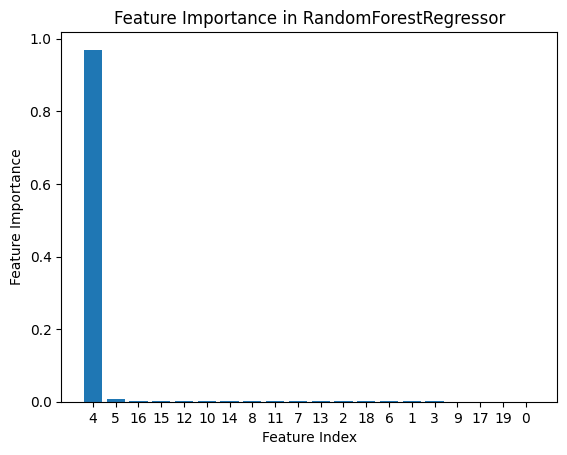

In [8]:
# 특성 중요도 확인
feature_importance = acc_model.feature_importances_

# 중요도를 기준으로 내림차순 정렬한 인덱스
sorted_idx = feature_importance.argsort()[::-1]

plt.bar(range(acc_X_train.shape[1]), feature_importance[sorted_idx])
plt.xticks(range(acc_X_train.shape[1]), sorted_idx)
plt.xlabel('Feature Index')
plt.ylabel('Feature Importance')
plt.title('Feature Importance in RandomForestRegressor')
plt.show()

## rawdata reprocessing

pnt = pd.read_csv('./use_data/result/input/PNT_EQU_RAW_daysum.csv',encoding='cp949')
sct = pd.read_csv('./use_data/result/input/SCT_EQU_RAW_daysum.csv',encoding='cp949')

mts = pd.read_csv('./use_data/csv/230920_교통과학장비 설치정보_경기남부.csv')

mts = mts[~mts['제어기 경도'].isna()]

mts.columns = [x.replace('*','') for x in mts.columns]

pnt.rename(columns = {'장비번호' : '장비고유구분','발생시각': '평균발생시각'},inplace=True)
sct.rename(columns = {'구간그룹명' : '장비고유구분'},inplace=True)

raw = pd.concat([pnt,sct])

raw['기준일자'] = pd.to_datetime(raw['기준일자'])

preraw = pd.DataFrame()
for idx in tqdm(raw['장비고유구분'].unique()):
    tmp = raw[raw['장비고유구분'] == idx]
    tmp.reset_index(drop=True,inplace=True)
    if tmp.iloc[0,2] == '구간과속':
        if tmp.iloc[0,1] == '오성면구간,신대리구간':
            est_date = '2021-07-31'
        else:
            est_date = mts[mts['구간그룹명'] == idx]['설치일자'].unique()[0]
    else:
        est_date = mts[mts['장비번호'] == idx]['설치일자'].unique()[0]
    tmp['장비설치일자'] = est_date
    tmp['장비설치일자'] = pd.to_datetime(tmp['장비설치일자'])
    tmp['설치경과일수'] = tmp['기준일자'] - tmp['장비설치일자']
    tmp['설치경과일수'] = tmp['설치경과일수'].apply(lambda x : x.days)
    preraw = pd.concat([preraw,tmp])


preraw.to_csv('./use_data/result/input/fullraw_4_remodel.csv',index=False)